# **Project 3**, APS1070 Fall 2023
#### **PCA [11 marks]**
**Deadline: Nov 17th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [temperature dataset](https://berkeleyearth.org/data/) that reports the average earth surface temperature for different cities for each month over the years 1992-2006.

Please fill out the following:


*   **Name**: 
*   **Student number**: 



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1 Mark + 1 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Open this link: https://classroom.github.com/a/BWpQKQJt to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/project-3-part-1-*********
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**

**https://github.com/APS1070-UofT/project-3-part-1-gravity0071**


 2. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<your-GitHub-email>”
git config --global user.name “<your-GitHub-username>”
```

 3. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 4. Get your assignment by the link you got in step 1:
```
git clone https://github.com/APS1070-UofT/project-3-part-1-*********
```

 5. A new folder should be created in your directory similar to:
```
C:\aps1070\project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 6. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 5.

 7. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 8. To submit your work, follow:
```
cd <your assignment folder>
git add F23_Project_3_Part_1_git.ipynb
git commit -m “Final Submission”
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 9. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (180, 180).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

In [86]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyCity.csv',
    index_col=0
)



In [87]:
from sklearn.preprocessing import StandardScaler
# print(data_raw)
#use the standardized data
scaler = StandardScaler()
normalized_city = scaler.fit_transform(data_raw.values)
scaled_city = pd.DataFrame(normalized_city, columns=data_raw.columns, index = data_raw.index)
print(scaled_city)

          1992-01-01  1992-02-01  1992-03-01  1992-04-01  1992-05-01  \
City                                                                   
A Coruña   -0.374552   -0.282114   -0.424624   -0.723247   -0.756287   
Aachen     -0.840911   -0.770716   -0.900585   -1.194914   -0.898816   
Aalborg    -0.702035   -0.768652   -1.053753   -1.467353   -1.067831   
Aba         1.221938    1.330075    1.259273    1.122835    0.905183   
Abadan     -0.103676    0.016328    0.018809    0.570233    1.227116   
...              ...         ...         ...         ...         ...   
Århus      -0.702035   -0.768652   -1.053753   -1.467353   -1.067831   
Çorlu      -0.667232   -0.858185   -0.828736   -0.809141   -0.932033   
Çorum      -1.235149   -1.322275   -1.133542   -1.071780   -1.220310   
Öskemen    -1.751406   -2.213472   -2.428347   -1.695173   -1.263039   
Ürümqi     -2.009703   -1.938252   -1.595248   -0.800148   -0.668633   

          1992-06-01  1992-07-01  1992-08-01  1992-09-01  1992-

In [88]:
#1. calculate covariance
cov_matrix = scaled_city.cov()
print(cov_matrix.shape)

(180, 180)


In [89]:
#2. get_sorted_eigen
import numpy as np
def get_sorted_eigen(df_cov):
  eigenvalues, eigenvectors = np.linalg.eigh(df_cov)
  args = (-eigenvalues).argsort()
  eigenValues = eigenvalues[args]
  eigenVectors = eigenvectors[:, args]
  return eigenValues, eigenVectors

In [90]:
#get the eigenvalue and eigenvector of the matrix
city_eigenvalue, city_eigenvector = get_sorted_eigen(cov_matrix)

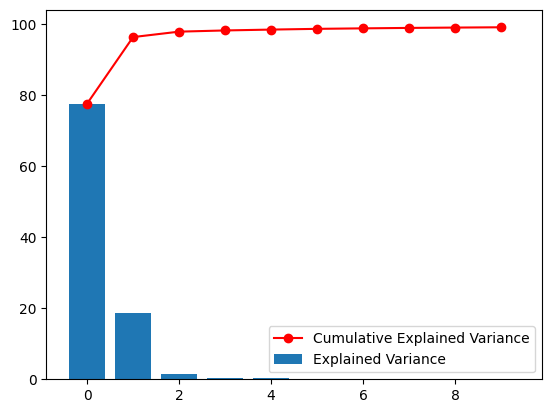

In [91]:
#3. plot
import matplotlib.pyplot as plt

# Calculate the cumulative explained variance
expVar = city_eigenvalue / np.sum(city_eigenvalue) * 100
cumExpVar = np.cumsum(expVar)

# Create the scree plot
plt.bar(range(10), expVar[:10], label='Explained Variance')
plt.plot(cumExpVar[:10], 'r-o', label='Cumulative Explained Variance')
plt.legend()
plt.show()

In [92]:
#4. how many PCs to cover 99%
for i in range(len(cumExpVar)):
  if cumExpVar[i] > 99:
    print('we need', i + 1,  "PCs")
    break

we need 9 PCs


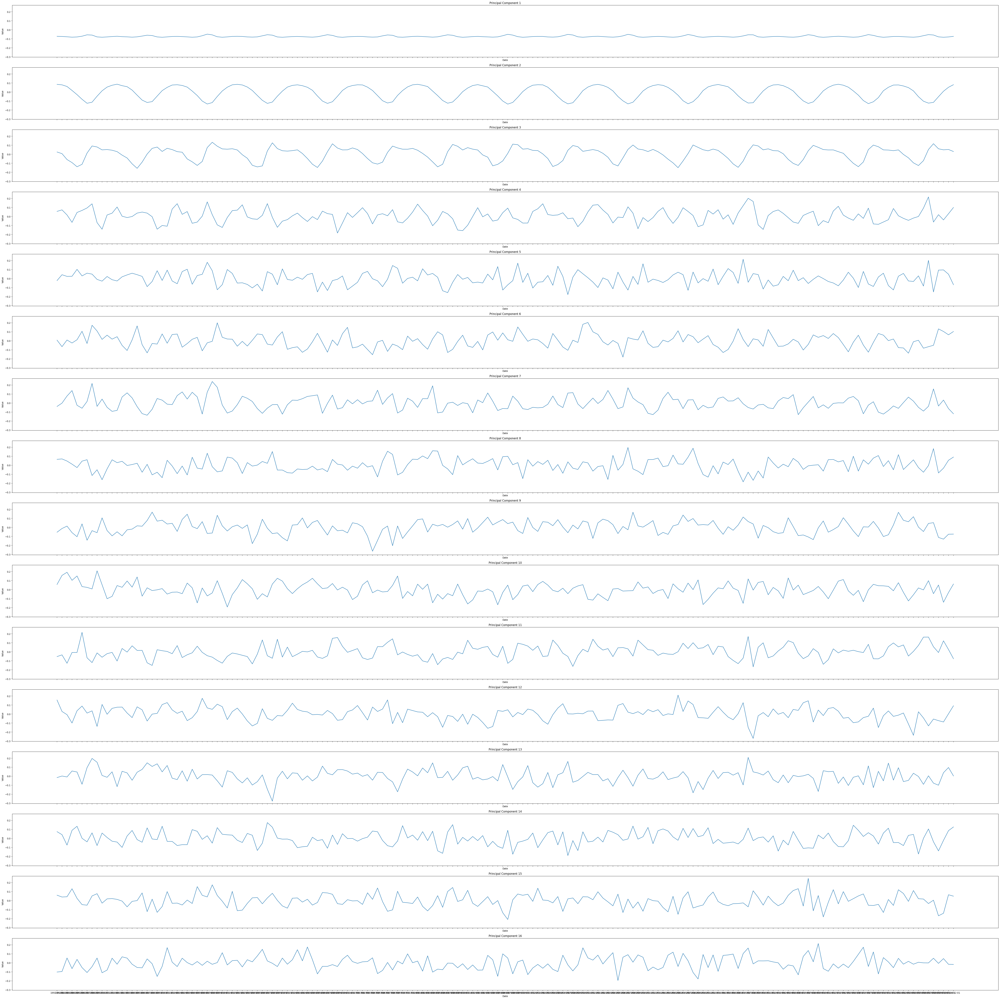

In [93]:
#5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element)
fig, axes = plt.subplots(16, figsize=(60, 60), sharex=True, sharey=True)

# Flatten the 2D array of subplots
axes = axes.flatten()

# Plot each principal component in a separate subplot
for i in range(16):
    axes[i].plot(data_raw.columns, city_eigenvector[:, i])
    title = 'Principal Component ' + str(i+1)
    axes[i].set_title(title)
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Value')

# Adjust subplot layout
plt.tight_layout()

# Show the plot
plt.show()

6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? [0.5]

we can see that the first two PCs is very smooth when comparing with other PCs, and the first two PCs have a regular pattern of undulation.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a city and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified city. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified city in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each month `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `Yakeshi`, `Zamboanga`, `Norilsk`, `Juliaca`, and `Doha` as inputs. **[0.5]**


In [94]:
import sys

def get_reconstruct_data_list(scaler, scaled_df, city_name, reconstruct_num_list):
  reconstruct = []
  for i in reconstruct_num_list:
    #city_eigenvalue, city_eigenvector: sorted
    W = city_eigenvector[:, 0:i]
    projection = np.dot(scaled_df.loc[city_name, :], W)
    #using the StandardScaler inverse_transform
    recons = scaler.inverse_transform(np.dot(projection, W.T).reshape(1, -1))
    reconstruct.append(recons)
  return reconstruct

def get_RMSE(original_df, reconstructions, city_name):
  now_residual_square = 0
  # print(reconstructions)
  for j in range(len(reconstructions[0])):
    now_residual_square = now_residual_square + (original_df.iloc[:,j].loc[city_name] - reconstructions[0][j])**2
  now_residual_square = (now_residual_square/len(reconstructions[0]))**0.5
  return now_residual_square


def get_smallest_residual(original_df, city_name, reconstructions):
  pcs = [1, 2, 4, 8, 16]
  min_index = 0
  min_residual_square = sys.maxsize
  for i in range(len(reconstructions)):
    now_residual_square = get_RMSE(original_df, reconstructions[i], city_name)
    if now_residual_square <= min_residual_square:
      min_residual_square = now_residual_square
      min_index = i
  return_value = []
  for i in range(len(reconstructions[min_index][0])):
    # print(reconstructions[min_index][0][i])
    return_value.append(original_df.iloc[:,i].loc[city_name] - reconstructions[min_index][0][i])
  # print('the min residual curve is from PC1 to PC' + str(pcs[min_index]))
  return return_value, pcs[min_index]


def plot_city_figures(original_df, city_name):

  #1 Plot the original time-series for the specified city
  plt.figure(figsize=(60, 4))
  plt.subplot(141)
  plt.plot(original_df.loc[city_name, :])
  plt.title(f'Original Data for {city_name}')

  # get the standerdized data
  scaler = StandardScaler()
  normalized_df = scaler.fit_transform(original_df)
  scaled_df = pd.DataFrame(normalized_city, columns=original_df.columns, index = original_df.index)

  pcs = [1, 2, 4, 8, 16]

  #2. The incremental reconstruction of the original (not standardized) time-series for the specified city in a single plot.
  reconstructions = get_reconstruct_data_list(scaler, scaled_df, city_name, pcs)
  # print(reconstructions
  plt.figure(figsize=(60, 4))
  plt.subplot(142)
  #oringinal data
  plt.plot(data_raw.columns, data_raw.loc[city_name, :], label='Original', linewidth='3', color='black')
  plt.title('reconstruction for ' + city_name)
  plt.xlabel('Date')
  plt.ylabel('Data')
  pcs = [1, 2, 4, 8, 16]
  for i in range(5):
    plt.plot(data_raw.columns, reconstructions[i].T, label = 'PC 1 to' + str(pcs[i]))
  plt.legend()

  #3. residual error
  min_residual, min_pc = get_smallest_residual(original_df, city_name, reconstructions)
  plt.figure(figsize=(60, 4))
  plt.subplot(143)
  plt.title('The residual error for ' + city_name + ', best construction is PC1 to PC' + str(min_pc))
  plt.xlabel('Date')
  plt.ylabel('residual error')
  plt.plot(data_raw.columns, min_residual)
  plt.show()

  #4. calculate the RMSE from 1 to 10
  num_list = [1,2,3,4,5,6,7,8,9,10]
  reconstruct_from_1_to_10 = get_reconstruct_data_list(scaler, scaled_df, city_name, num_list)
  # print(reconstruct_from_1_to_10)
  RSMEs = []
  for i in range(10):
    RSME = get_RMSE(original_df, reconstruct_from_1_to_10[i], city_name)
    RSMEs.append(RSME)
  plt.figure(figsize=(60, 4))
  plt.subplot(144)
  plt.title('RMSE for city '+ city_name)
  plt.xlabel('PCs')
  plt.ylabel('RMSE')
  plt.plot(range(10), RSMEs)
  plt.show()

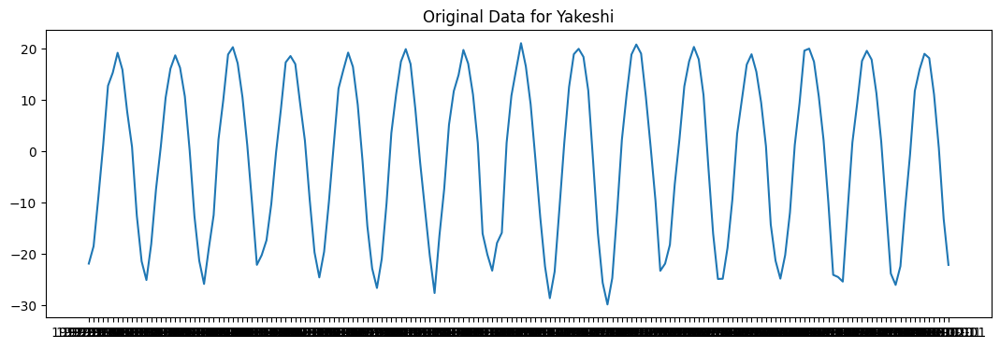

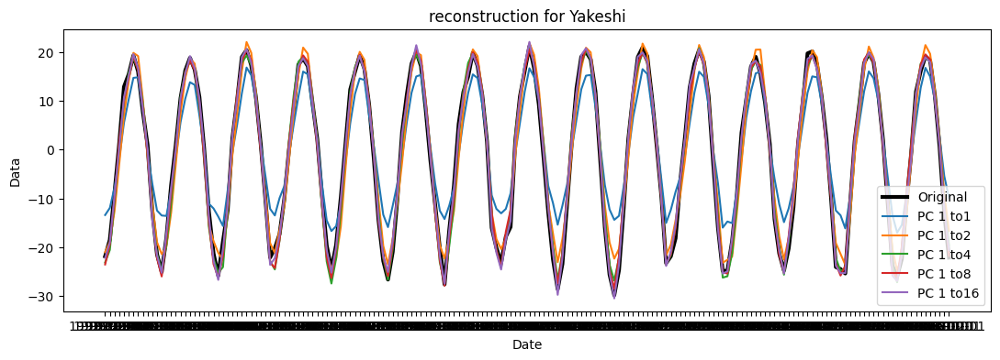

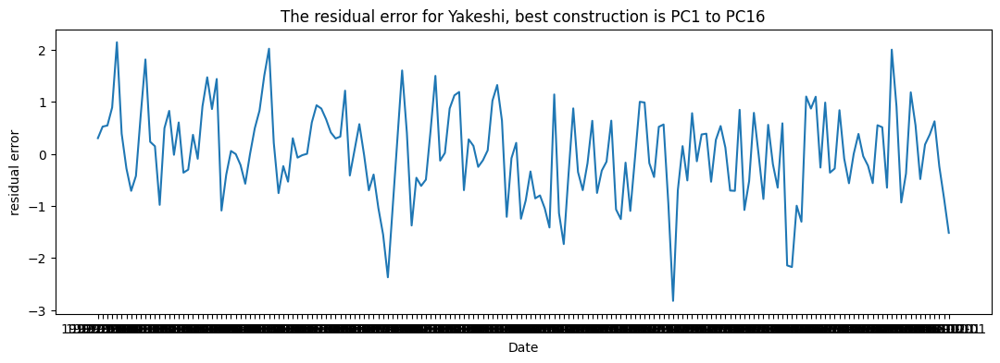

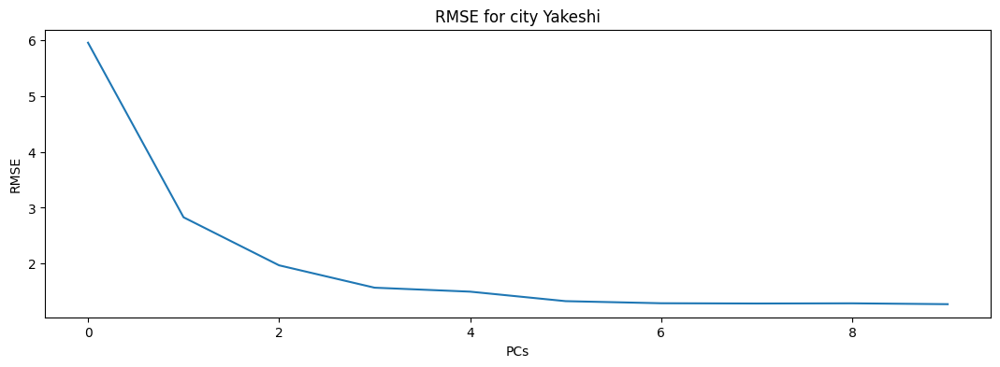

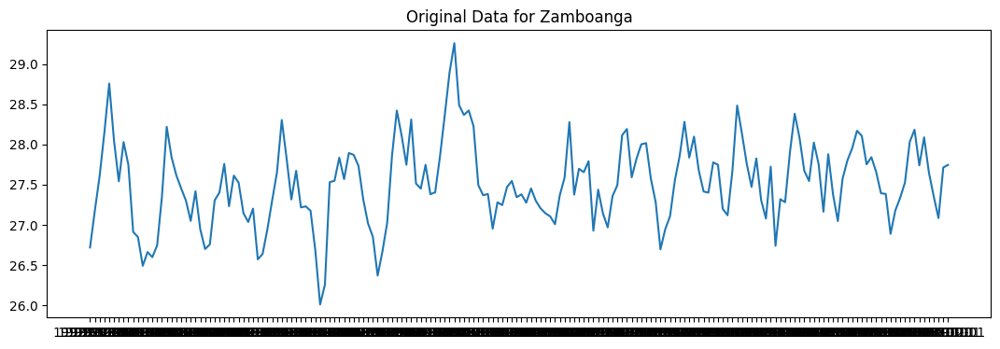

...

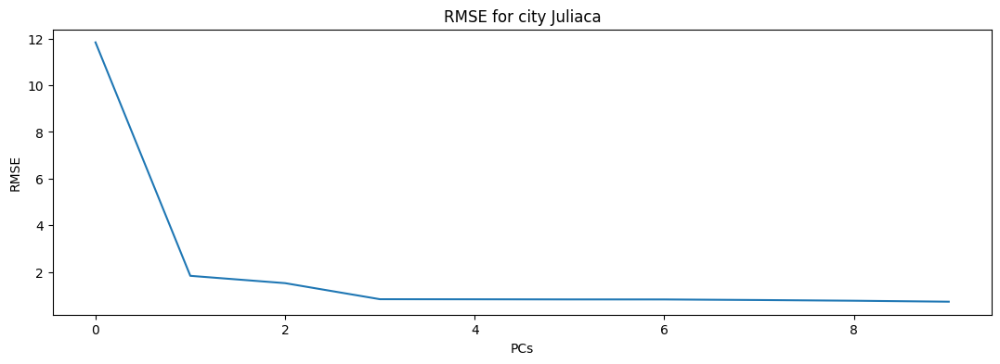

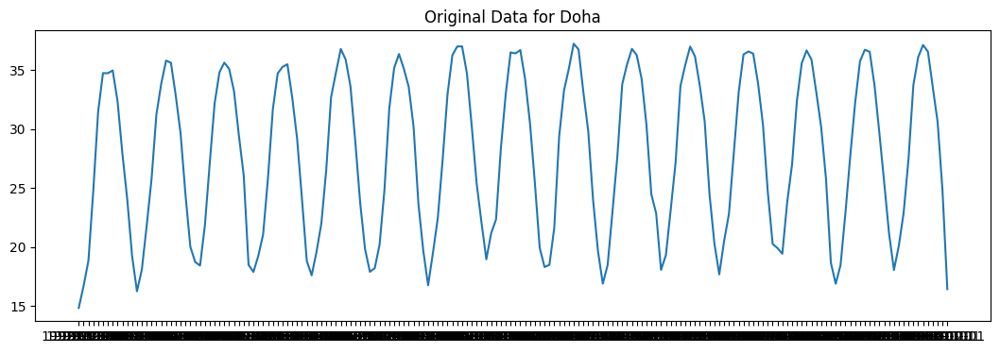

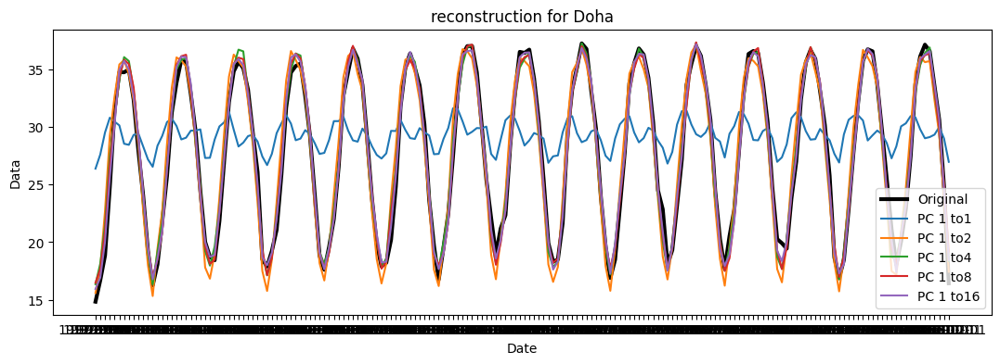

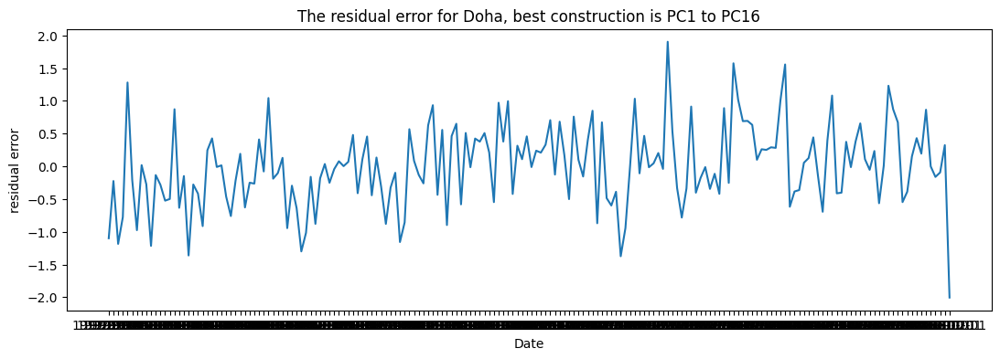

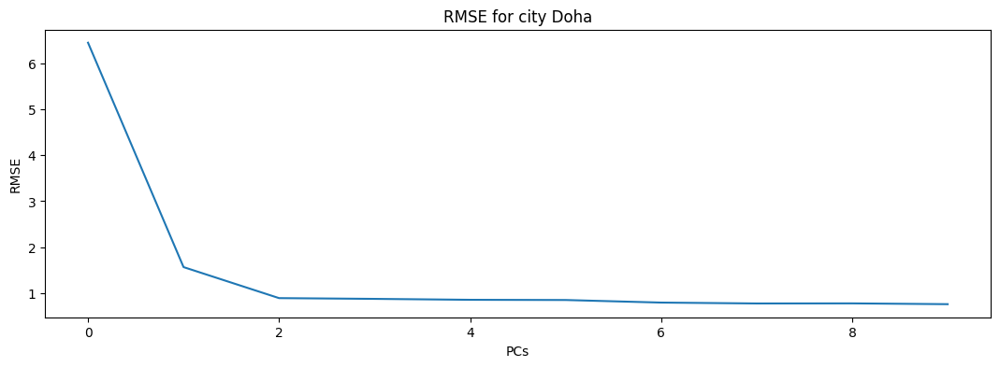

In [95]:
city_list = ['Yakeshi', 'Zamboanga', 'Norilsk', 'Juliaca', 'Doha']
for city in city_list:
  plot_city_figures(data_raw, city)

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

**Answer:**

1. we don't have to standardization or covariance in SVD, but in this part, i used standardized data since it can achieve better performance.
2. we can see from the result that SVD can achieve same result as PCA, by plotting the two line in a same figure, we can see that they are overlapped.

In [96]:
import sys
#changed part for SVD
def get_reconstruct_data_list_SVD(scaler, original_df, city_name, reconstruct_num_list):
  reconstruct = []
  U, S, VT = np.linalg.svd(original_df)
  for i in reconstruct_num_list:
    U_r = U[:, :i]
    S_r = np.diag(S[:i])
    VT_r = VT[:i, :]
    projected_data = np.dot(U_r, np.dot(S_r, VT_r))
    p_data = pd.DataFrame(projected_data, columns = original_df.columns, index = original_df.index)
    recons = scaler.inverse_transform(np.array(p_data.loc[city_name,:].values.tolist()).reshape(1, -1))
    reconstruct.append(recons)
  return reconstruct

def get_RMSE_SVD(original_df, reconstructions, city_name):
  now_residual_square = 0
  for j in range(len(reconstructions[0])):
    now_residual_square = now_residual_square + (original_df.iloc[:,j].loc[city_name] - reconstructions[0][j])**2
  now_residual_square = (now_residual_square/len(reconstructions[0]))**0.5
  return now_residual_square

def get_smallest_residual_SVD(original_df, city_name, reconstructions):
  pcs = [1, 2, 4, 8, 16]
  min_index = 0
  min_residual_square = sys.maxsize
  for i in range(len(reconstructions)):
    now_residual_square = get_RMSE_SVD(original_df, reconstructions[i], city_name)
    if now_residual_square <= min_residual_square:
      min_residual_square = now_residual_square
      min_index = i
  return_value = []
  for i in range(len(reconstructions[min_index][0])):
    # print(original_df.iloc[:,i].loc[city_name] - reconstructions[min_index][0][i])
    return_value.append(original_df.iloc[:,i].loc[city_name] - reconstructions[min_index][0][i])
  return return_value, pcs[min_index]


def plot_city_figures_SVD(original_df, city_name):
  # get the standerdized data
  scaler = StandardScaler()
  normalized_df = scaler.fit_transform(original_df)
  scaled_df = pd.DataFrame(normalized_city, columns=original_df.columns, index = original_df.index)

  pcs = [1, 2, 4, 8, 16]

  #1 SVD-----Plot the original time-series for the specified city
  plt.figure(figsize=(60, 4))
  plt.subplot(141)
  plt.plot(original_df.loc[city_name, :])
  plt.title(f'Original Data for {city_name}')

  #2. The incremental reconstruction of the original (not standardized) time-series for the specified city in a single plot.
  reconstructions_SVD = get_reconstruct_data_list_SVD(scaler, scaled_df, city_name, pcs)
  #2. PCA-----The incremental reconstruction of the original (not standardized) time-series for the specified city in a single plot.
  reconstructions = get_reconstruct_data_list(scaler, scaled_df, city_name, pcs)
  # print(reconstructions
  plt.figure(figsize=(60, 4))
  plt.subplot(142)
  #oringinal data
  plt.plot(data_raw.columns, data_raw.loc[city_name, :], label='Original', linewidth='3', color='black')
  plt.title('reconstruction for ' + city_name)
  plt.xlabel('Date')
  plt.ylabel('Data')
  pcs = [1, 2, 4, 8, 16]
  for i in range(5):
    plt.plot(data_raw.columns, reconstructions_SVD[i].T, label = 'PC 1 to' + str(pcs[i]))
  plt.legend()


  #3. residual error
  min_residual, min_pc = get_smallest_residual_SVD(original_df, city_name, reconstructions_SVD)
  #3. PCA--residual error
  min_residual_PCA, min_pc_PCA = get_smallest_residual(original_df, city_name, reconstructions)
  plt.figure(figsize=(60, 4))
  plt.subplot(143)
  plt.title('The residual error for ' + city_name + ', best construction is PC1 to PC' + str(min_pc) + ', using PCA and AVS')
  plt.xlabel('Date')
  plt.ylabel('residual error')
  # print(min_residual)
  # print(min_residual_PCA)
  plt.plot(data_raw.columns, min_residual, label = 'SVD')
  plt.plot(data_raw.columns, min_residual_PCA, label = 'PCA')
  plt.legend()
  plt.show()


  #4. calculate the RMSE from 1 to 10
  num_list = [1,2,3,4,5,6,7,8,9,10]
  reconstruct_from_1_to_10_SVD = get_reconstruct_data_list_SVD(scaler, scaled_df, city_name, num_list)
  RSMEs = []
  for i in range(10):
    RSME = get_RMSE_SVD(original_df, reconstruct_from_1_to_10_SVD[i], city_name)
    RSMEs.append(RSME)
  #4. PCA--calculate the RMSE from 1 to 10
  reconstruct_from_1_to_10 = get_reconstruct_data_list(scaler, scaled_df, city_name, num_list)
  RSMEs_PCA = []
  for i in range(10):
    RSME = get_RMSE(original_df, reconstruct_from_1_to_10[i], city_name)
    RSMEs_PCA.append(RSME)

  plt.figure(figsize=(60, 4))
  plt.subplot(144)
  plt.title('RMSE for city '+ city_name + ', using PCA and SVD')
  plt.xlabel('PCs')
  plt.ylabel('RMSE')
  # print(RSMEs)
  # print(RSMEs_PCA)
  plt.plot(range(10), RSMEs, label='SVD')
  plt.plot(range(10), RSMEs_PCA, label='PCA')
  plt.legend()
  plt.show()

# plot_city_figures_SVD(data_raw, 'Yakeshi')

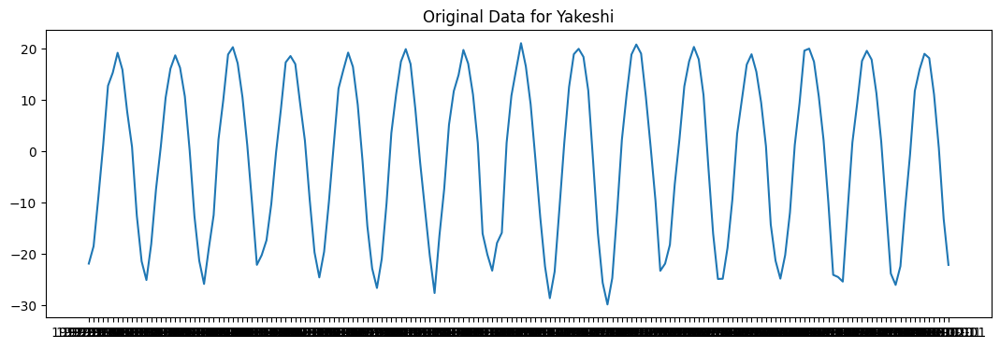

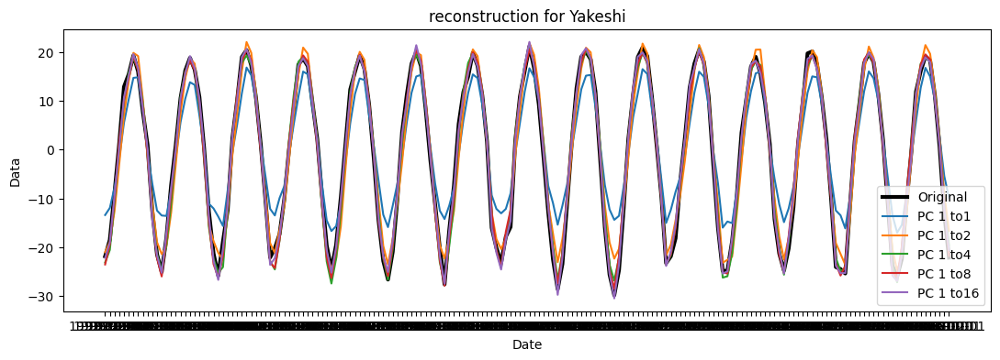

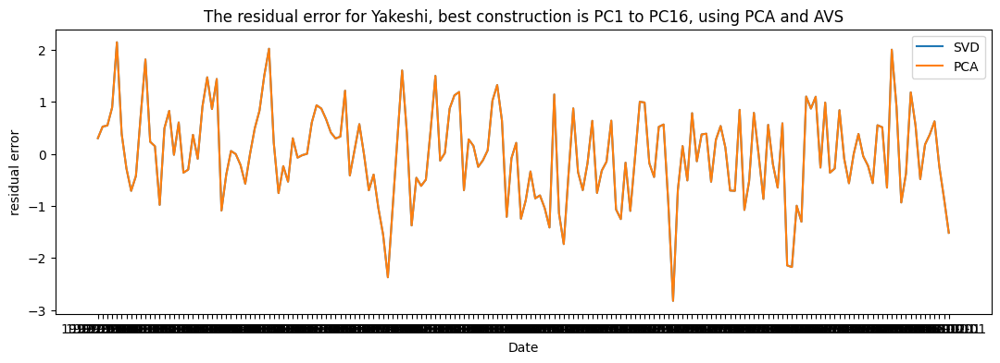

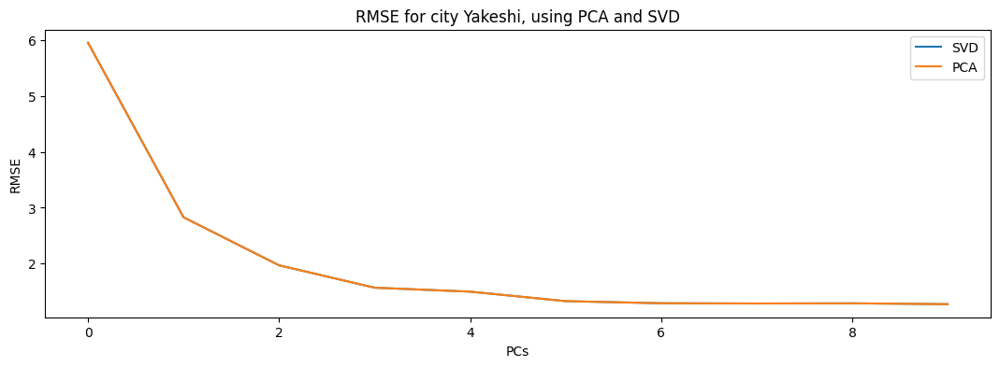

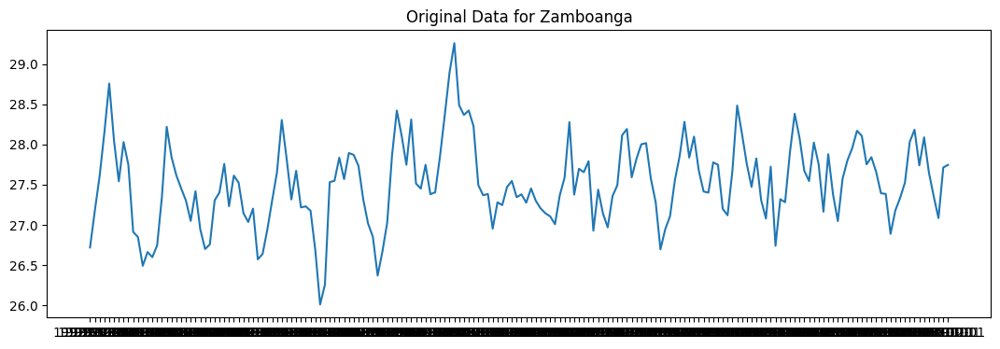

...

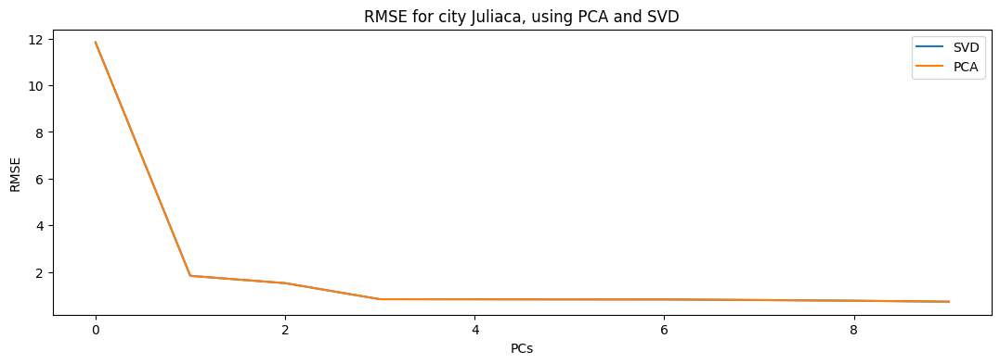

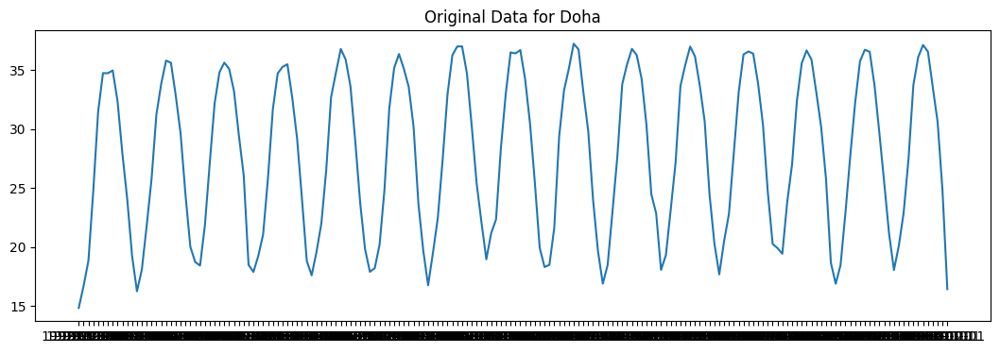

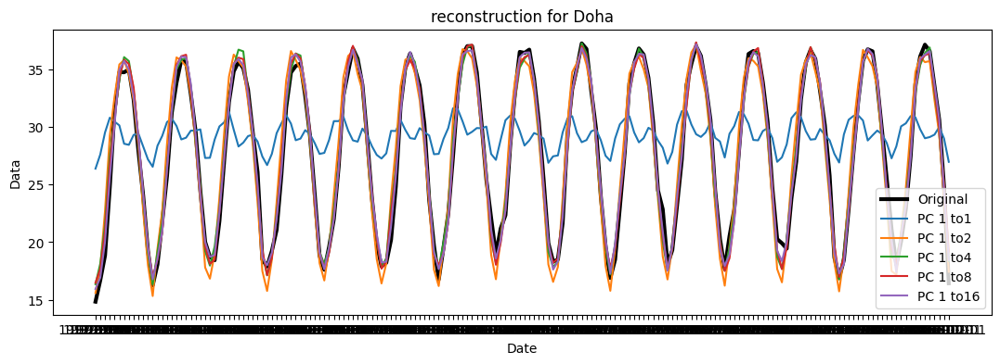

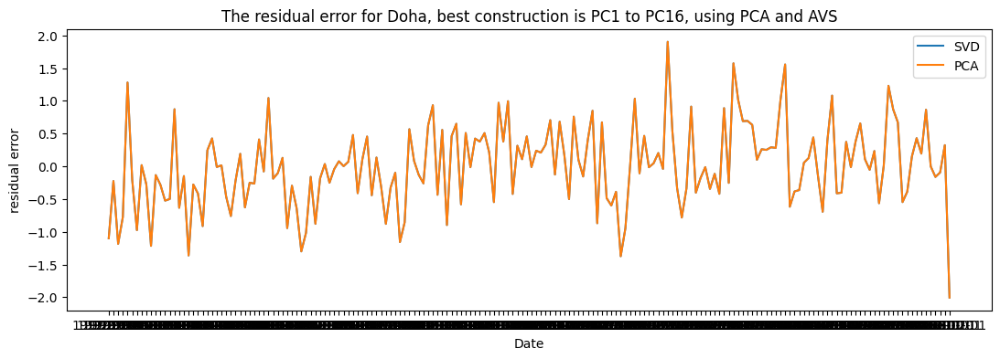

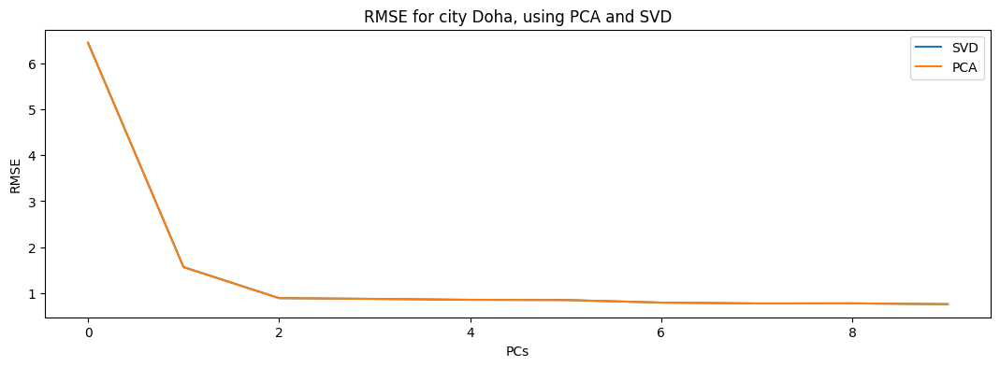

In [97]:
city_list = ['Yakeshi', 'Zamboanga', 'Norilsk', 'Juliaca', 'Doha']
for city in city_list:
  plot_city_figures_SVD(data_raw, city)

# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average temperatures per states (not cities) provided [here](https://github.com/Sabaae/Dataset/blob/main/TemperaturesbyState.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). If there is a missing value for the average temperature of a particular state at a given date, make sure to remove that date completely from the dataset, even if the data of that specific date exists for other states.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. How many features does the final dataset have? How many states are there?


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing the states, you may use `Jilin`, `Nunavut`, `Rio Grande Do Norte`, `Louisiana`, and `Tasmania`. **[1]**


The code below helps you to upload your new CSV file to your colab session.



```
# the code transfer the original code to desired format
import pandas as pd
import re
import numpy as np

data_raw = pd.read_csv('/Users/shawnwan/Downloads/Safari/TemperaturesbyState.csv')
# print(data_raw)
date = []
city = []
# print(data_raw.shape)
pattern = r'\d{4}/\d{1,2}/\d{1}'
for i in range(data_raw.shape[0]):
    date_now = data_raw.iloc[i, 0]
    city_now = data_raw.iloc[i, 1]
    if city_now not in city:
        city.append(city_now)
    if date_now not in date and re.match(pattern, date_now):
        date.append(date_now)

modified_data = np.zeros((len(city), len(date)))
for i in range(data_raw.shape[0]):
    date_now = data_raw.iloc[i, 0]
    city_now = data_raw.iloc[i, 1]
    temp_now = data_raw.iloc[i, 2]
    if city_now in city and date_now in date:
        row = city.index(city_now)
        column = date.index(date_now)
        modified_data[row][column] = temp_now

# remove the column of nan
nan_columns = np.any(np.isnan(modified_data), axis=0)
# print(nan_columns)
filtered_data = modified_data[:, ~nan_columns]
filtered_date = date[:len(date) - 1]

# save the file to csv
save_df = pd.DataFrame(filtered_data, columns=filtered_date, index=city)
save_df.to_csv('/Users/shawnwan/Desktop/modified.csv', index=False)
```



In [ ]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()

In [99]:
### YOUR CODE HERE ###
modified_data = pd.read_csv('/content/modified.csv')
modified_data = modified_data.set_index('Index')
print(modified_data)

            1963/1/1  1963/2/1  1963/3/1  1963/4/1  1963/5/1  1963/6/1  \
Index                                                                    
Acre          26.037    25.659    25.506    26.019    25.675    25.097   
Adygey        -1.260     2.380     1.506     8.992    15.204    17.843   
Aga Buryat   -22.297   -16.490    -6.900    -1.146     8.558    13.960   
Alabama        4.234     5.685    14.853    18.815    22.172    25.254   
Alagoas       26.389    26.215    25.830    25.340    24.060    22.792   
...              ...       ...       ...       ...       ...       ...   
Yaroslavl'   -18.650   -12.679   -12.197     2.414    15.048    12.505   
Yevrey       -20.697   -17.472    -6.148     2.557    10.782    16.184   
Yukon        -24.129   -19.783   -17.878    -6.328     3.664     7.780   
Yunnan         7.286    10.041    13.768    17.398    20.858    20.698   
Zhejiang       2.765     5.534    11.229    16.736    22.544    23.874   

            1963/7/1  1963/8/1  1963/

In [102]:
print(modified_data.shape)

(241, 608)


we have 241 states and 608 features

In [100]:
scaler = StandardScaler()
normalized_state = scaler.fit_transform(modified_data.values)
scaled_state = pd.DataFrame(normalized_state, columns=modified_data.columns, index = modified_data.index)
cov_matrix_state = scaled_state.cov()
city_eigenvalue, city_eigenvector = get_sorted_eigen(cov_matrix_state)

normalized_city = normalized_state
data_raw = modified_data

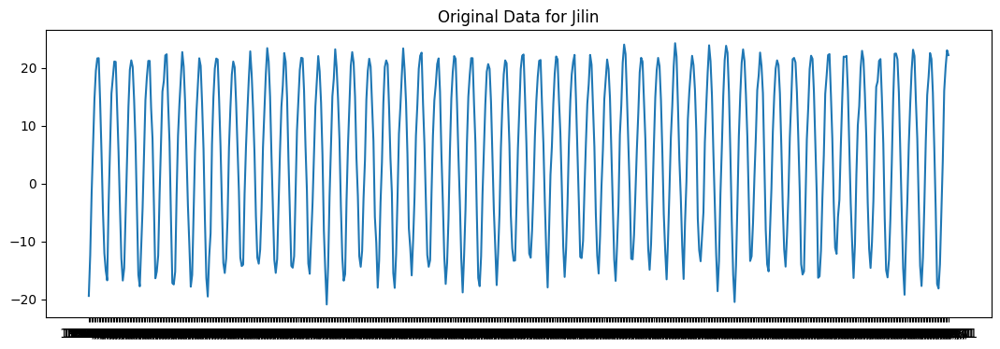

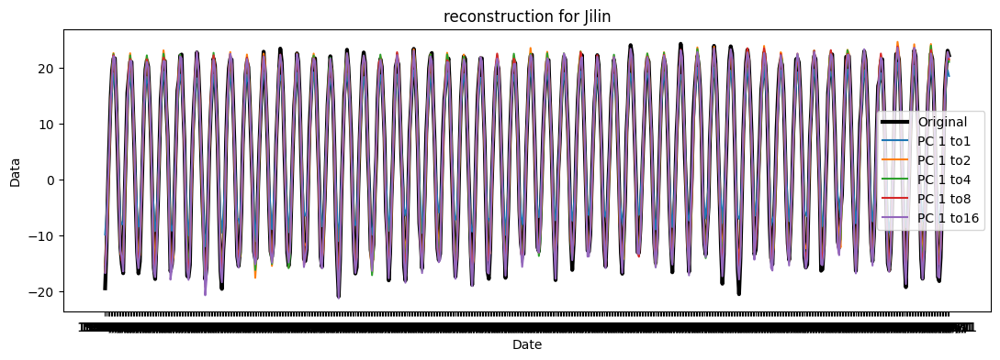

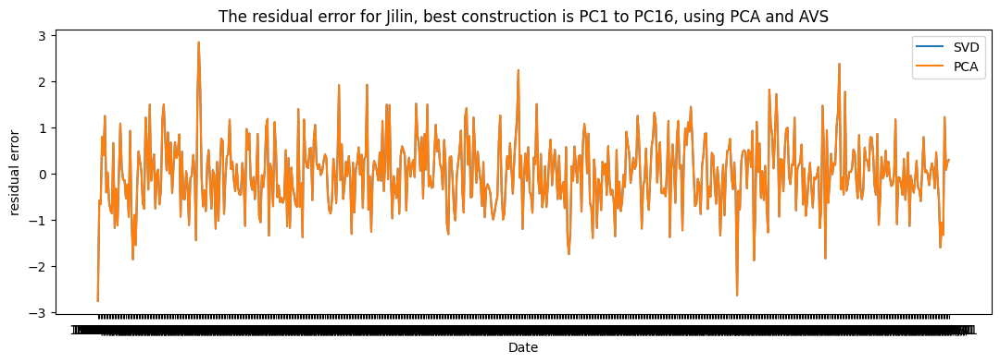

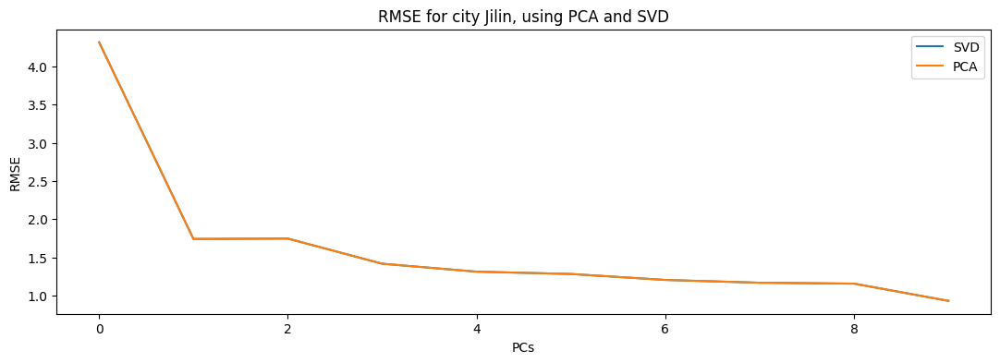

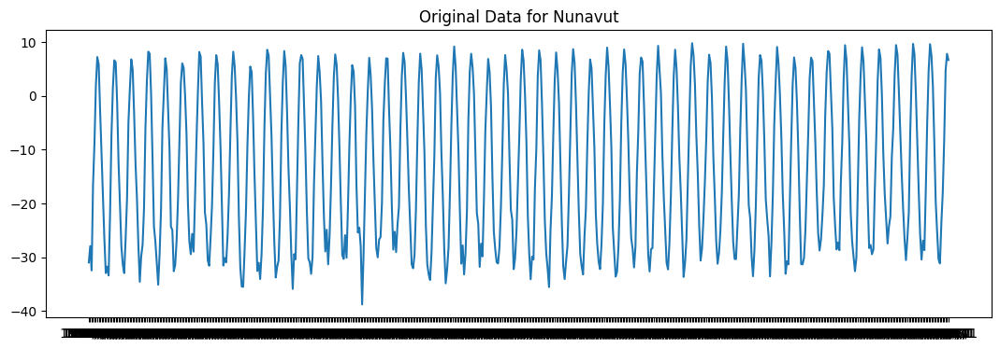

...

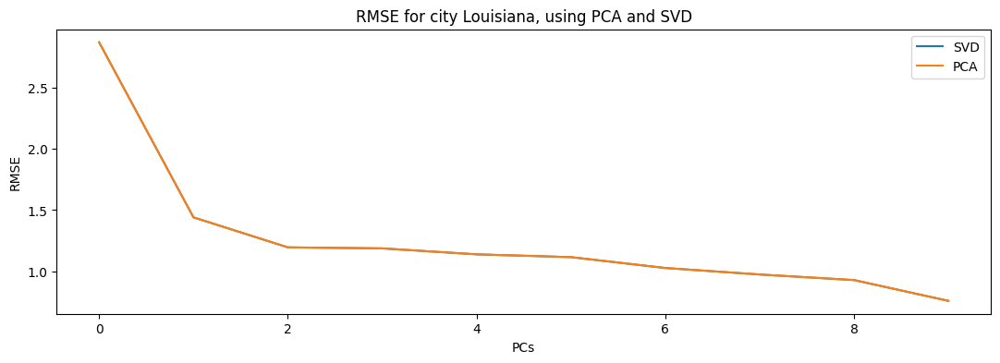

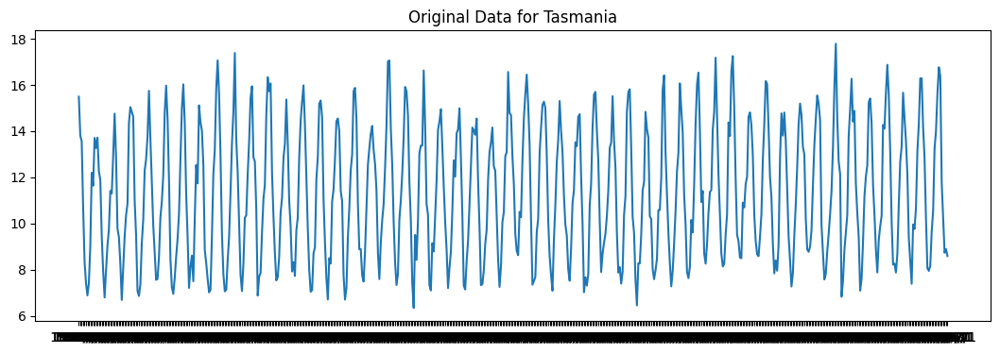

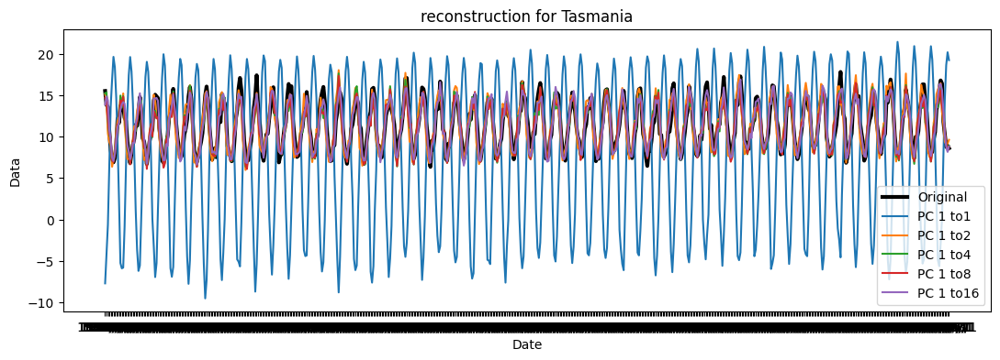

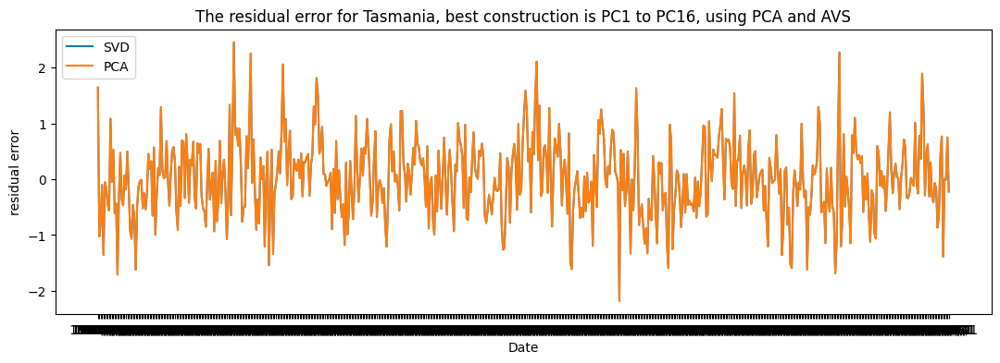

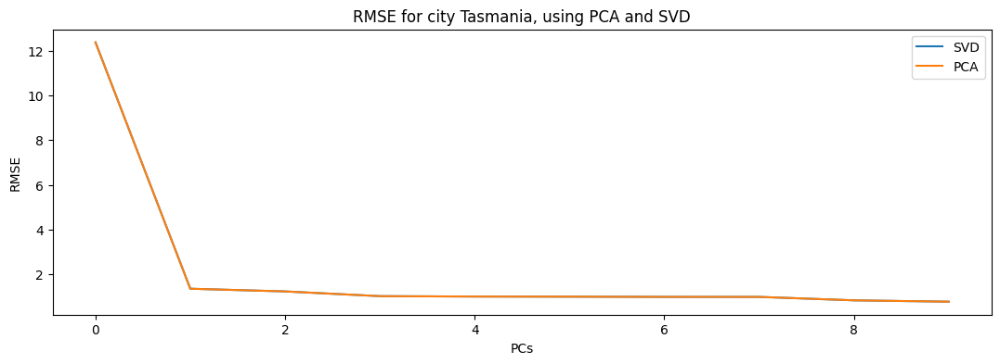

In [101]:
state_list = ['Jilin', 'Nunavut', 'Rio Grande Do Norte', 'Louisiana', 'Tasmania']
for state in state_list:
  plot_city_figures_SVD(modified_data, state)

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Temperature Data:

1. https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data

2. https://berkeleyearth.org/data/

